In [12]:
%reload_ext autoreload
%autoreload 2

In [13]:
import matplotlib.pyplot as plt

import numpy as np

from mcopt.pipeline import Pipeline
import mcopt.pipeline.util as util
from mcopt import MorseGraph, ot

In [14]:
pipeline = Pipeline('../pipeline.config.json')

tropopause = pipeline.graph('tropopause:::2')

> Loading tropopause complex
  config unchanged, reading complex


> Loading tropopause graph


In [15]:
len(tropopause.frames)

16

In [16]:
src = tropopause.frames[0]
dests = tropopause.frames[1:]

In [17]:
cmap = 'cool'
num_random_iter = 10
m = 0.95
rng = np.random.default_rng(42)

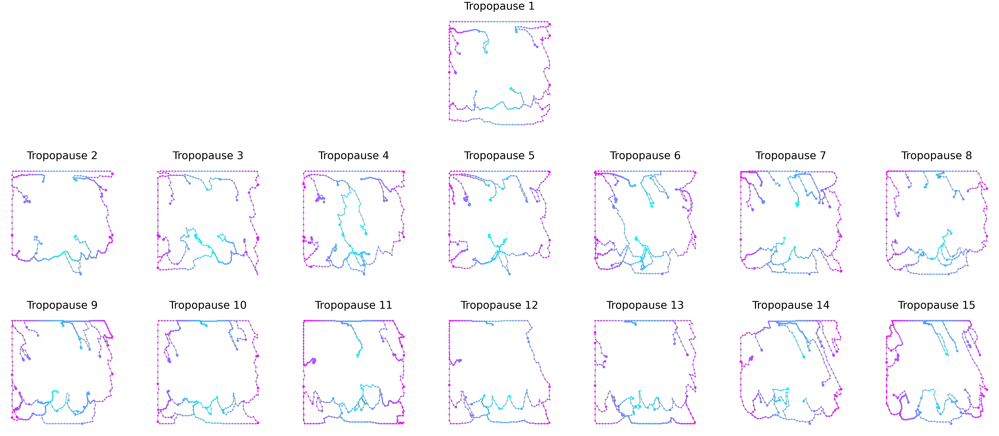

In [18]:
w, h = 7, 3

fig, axes = plt.subplots(h, w, figsize=(12 * w, 12 * h))

for ax in axes.ravel():
  ax.set_axis_off()

src.draw(ax=axes[0, w//2], cmap=cmap)
axes[0, w//2].set_title('Tropopause 1', fontsize=50)

for i, (dest, ax) in enumerate(zip(dests, axes.ravel()[w:])):
  dest.draw(ax=ax, cmap=cmap)
  ax.set_title(f'Tropopause {i + 2}', fontsize=50)

In [19]:
couplings = []

src_net = src.to_mpn(hist='degree', dist='geo')

for dest in dests:
  dest_net = dest.to_mpn(hist='degree', dist='geo')
    
  min_dist = float('inf')
  min_coupling = None
  
  for _ in range(num_random_iter):
    coupling, dist = ot.GW(src_net, dest_net, random_G0=True, random_state=rng)
    
    if dist < min_dist:
      min_dist = dist
      min_coupling = coupling
    
  couplings.append(coupling)

Text(0.5, 0.98, 'Tropopause GW')

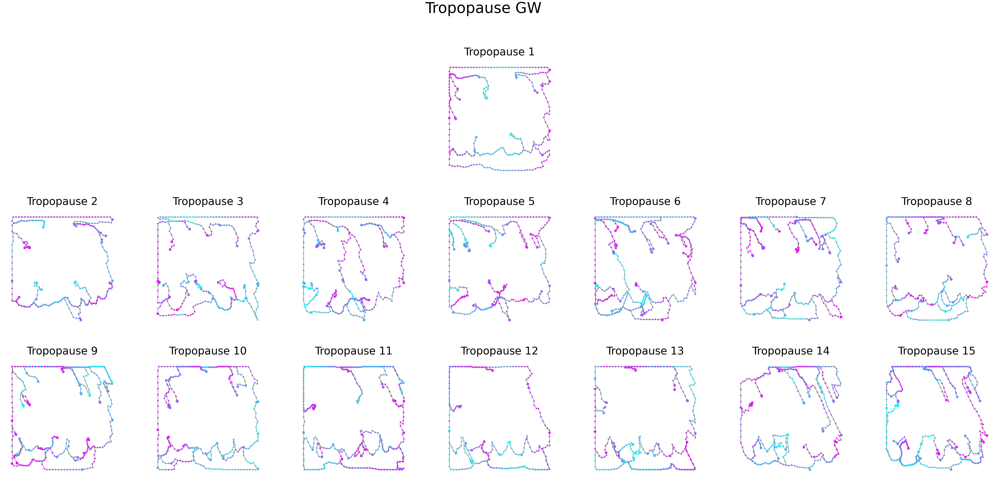

In [20]:
w, h = 7, 3

fig, axes = plt.subplots(h, w, figsize=(12 * w, 12 * h))

for ax in axes.ravel():
  ax.set_axis_off()

src_node_color = src.node_color_by_position()
src.draw(ax=axes[0, w//2], cmap=cmap, node_color=src_node_color)
axes[0, w//2].set_title('Tropopause 1', fontsize=50)

for i, (dest, coupling, ax) in enumerate(zip(dests, couplings, axes.ravel()[w:])):
  dest.draw(ax=ax, cmap=cmap, node_color=dest.node_color_by_coupling(src_node_color, coupling))
  ax.set_title(f'Tropopause {i + 2}', fontsize=50)
  
fig.suptitle('Tropopause GW', fontsize=70)

In [21]:
couplings = []

src_net = src.to_mpn(hist='degree', dist='geo')

for dest in dests:
  dest_net = dest.to_mpn(hist='degree', dist='geo')
    
  M = MorseGraph.attribute_cost_matrix(src, dest)  

  
  coupling, _ = ot.fGW(src_net, dest_net, M, random_G0=True, random_state=rng)
    
  couplings.append(coupling)

Text(0.5, 0.98, 'Tropopause fGW')

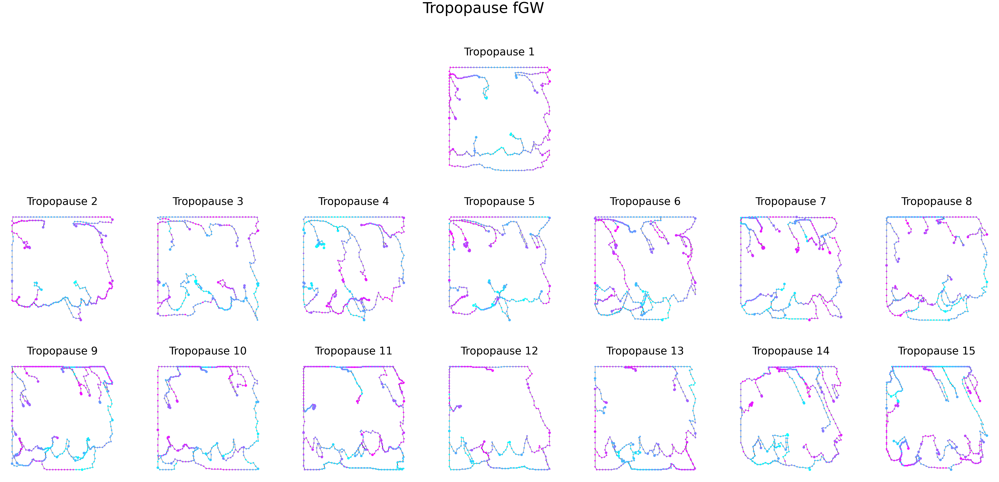

In [22]:
w, h = 7, 3

fig, axes = plt.subplots(h, w, figsize=(12 * w, 12 * h))

for ax in axes.ravel():
  ax.set_axis_off()

src_node_color = src.node_color_by_position()
src.draw(ax=axes[0, w//2], cmap=cmap, node_color=src_node_color)
axes[0, w//2].set_title('Tropopause 1', fontsize=50)

for i, (dest, coupling, ax) in enumerate(zip(dests, couplings, axes.ravel()[w:])):
  dest.draw(ax=ax, cmap=cmap, node_color=dest.node_color_by_coupling(src_node_color, coupling))
  ax.set_title(f'Tropopause {i + 2}', fontsize=50)
  
fig.suptitle('Tropopause fGW', fontsize=70)

In [23]:
couplings = []
m = 0.91

src_net = src.to_mpn(hist='degree', dist='geo')

for dest in dests:
  dest_net = dest.to_mpn(hist='degree', dist='geo')
    
  M = MorseGraph.attribute_cost_matrix(src, dest)  
  
  coupling, dist = ot.fpGW(src_net, dest_net, m, M)
    
  couplings.append(coupling)

Text(0.5, 0.98, 'Tropopause fpGW')

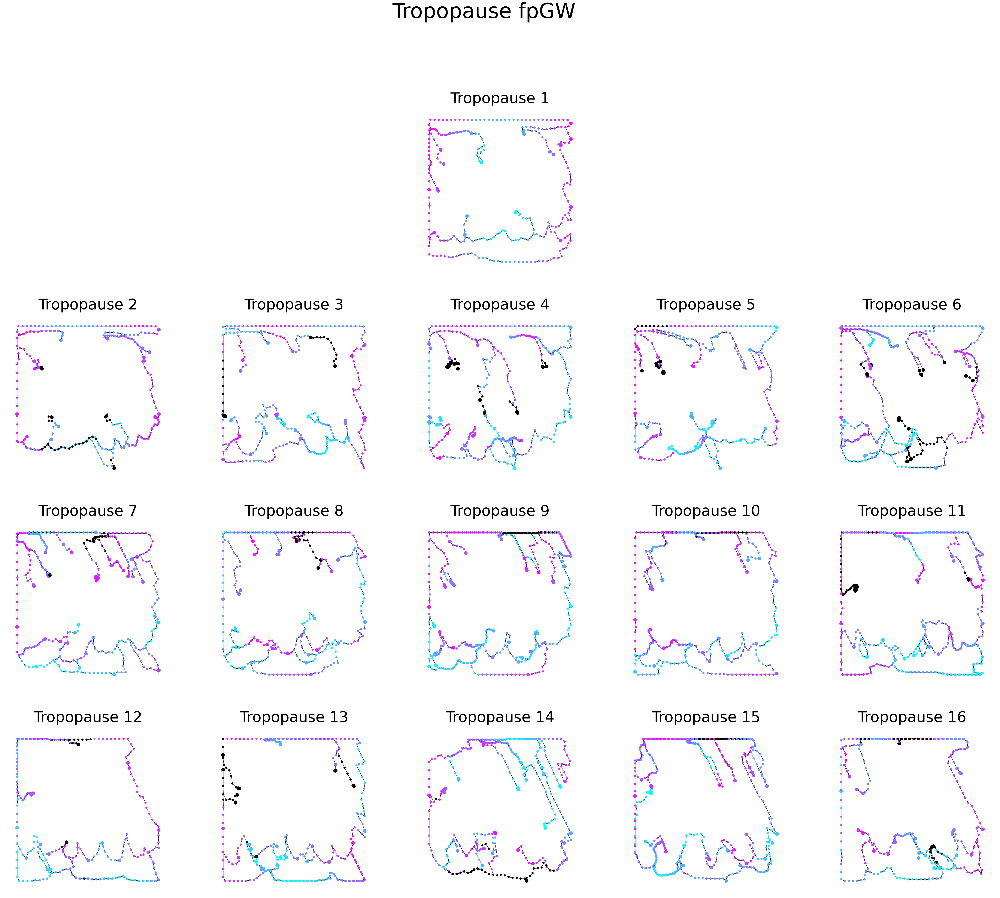

In [25]:
w, h = 5, 4

fig, axes = plt.subplots(h, w, figsize=(12 * w, 12 * h))

for ax in axes.ravel():
  ax.set_axis_off()

src_node_color = src.node_color_by_position()
src.draw(ax=axes[0, w//2], cmap=cmap, node_color=src_node_color)
axes[0, w//2].set_title('Tropopause 1', fontsize=50)

for i, (dest, coupling, ax) in enumerate(zip(dests, couplings, axes.ravel()[w:])):
  dest.draw(ax=ax, cmap=cmap, node_color=dest.node_color_by_coupling(src_node_color, coupling))
  ax.set_title(f'Tropopause {i + 2}', fontsize=50)
  
fig.suptitle('Tropopause fpGW', fontsize=70)

In [28]:
couplings = []
ms = [0.95, 0.88, 0.88, 0.83, 0.90, 0.85, 1, 0.95, 1, 0.93, 0.82, 0.82, 0.81, 0.84, 0.99]

src_net = src.to_mpn(hist='degree', dist='geo')

for dest, m in zip(dests, ms):
  dest_net = dest.to_mpn(hist='degree', dist='geo')
    
  M = MorseGraph.attribute_cost_matrix(src, dest)  
  
  if np.isclose(m, 1):
    coupling, dist = ot.fGW(src_net, dest_net, M)
  else:
    coupling, dist = ot.fpGW(src_net, dest_net, m, M)
    
  couplings.append((coupling, m))

Text(0.5, 0.98, 'Tropopause fpGW')

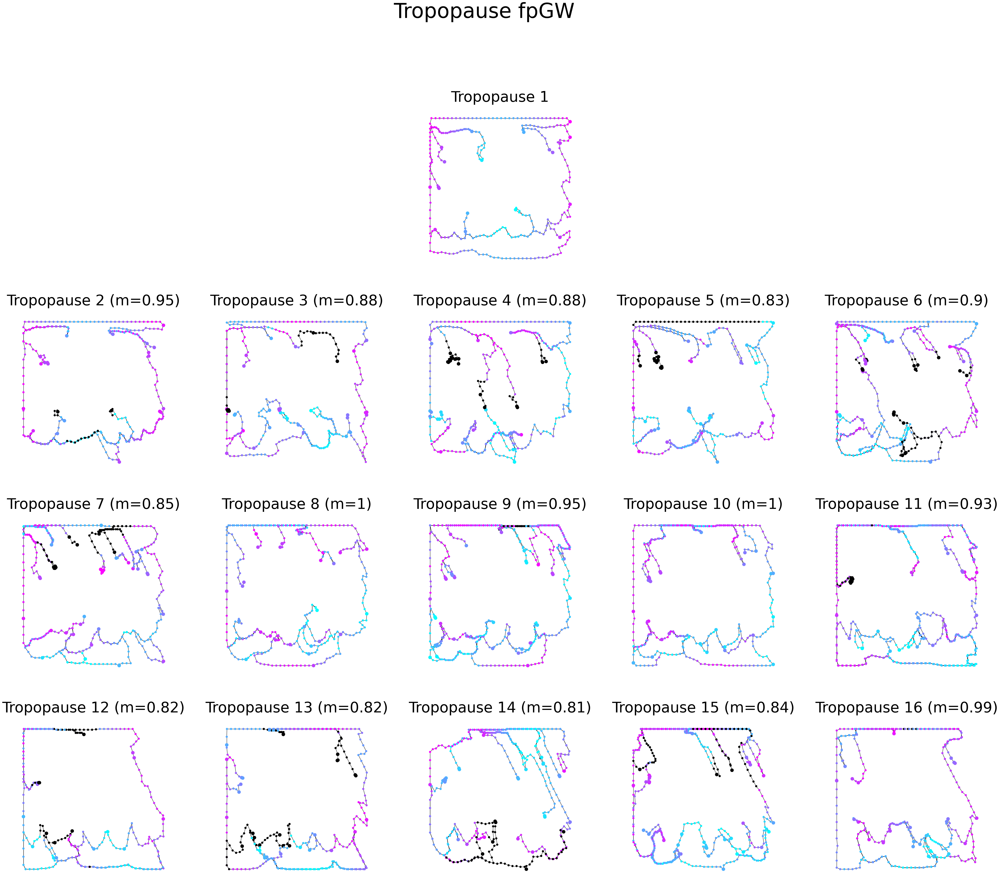

In [30]:
w, h = 5, 4

fig, axes = plt.subplots(h, w, figsize=(12 * w, 12 * h))

for ax in axes.ravel():
  ax.set_axis_off()

src_node_color = src.node_color_by_position()
src.draw(ax=axes[0, w//2], cmap=cmap, node_color=src_node_color)
axes[0, w//2].set_title('Tropopause 1', fontsize=50)

for i, (dest, (coupling, m), ax) in enumerate(zip(dests, couplings, axes.ravel()[w:])):
  dest.draw(ax=ax, cmap=cmap, node_color=dest.node_color_by_coupling(src_node_color, coupling))
  ax.set_title(f'Tropopause {i + 2} (m={m})', fontsize=50)
  
fig.suptitle('Tropopause fpGW', fontsize=70)